In [1]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard fbe67e465375231474a2ad80a4389efc77ecff99

Cloning into 'yolov5'...
remote: Enumerating objects: 17270, done.
remote: Counting objects: 100% (1/1), done.
remote: Total 17270 (delta 0), reused 0 (delta 0), pack-reused 17269 (from 2)
Receiving objects: 100% (17270/17270), 16.12 MiB | 3.04 MiB/s, done.
Resolving deltas: 100% (11858/11858), done.
/home/ritabratopani/Documents/MiniProject/yolov5
HEAD is now at fbe67e46 Fix `OMP_NUM_THREADS=1` for macOS (#8624)


/home/ritabratopani/pythonEnv/venv/lib/python3.12/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets


# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 2.6.0+cu124 CPU


In [3]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="SqxHxUmH1bESmMpTc8Wo")
project = rf.workspace("plant-disease-detection").project("fieldplant")
version = project.version(11)
dataset = version.download("yolov5")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to FieldPlant-11 in yolov5pytorch:: 100%|██████████| 10318/10318 [00:43<00:00, 236.87it/s]


In [4]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

names:
- Cassava Bacterial Blight
- Cassava Brown Leaf Spot
- Cassava Healthy
- Cassava Mosaic
- Cassava Root Rot
- Corn Brown Spots
- Corn Charcoal
- Corn Chlorotic Leaf Spot
- Corn Gray leaf spot
- Corn Healthy
- Corn Insects Damages
- Corn Mildew
- Corn Purple Discoloration
- Corn Smut
- Corn Streak
- Corn Stripe
- Corn Violet Decoloration
- Corn Yellow Spots
- Corn Yellowing
- Corn leaf blight
- Corn rust leaf
- Tomato Brown Spots
- Tomato bacterial wilt
- Tomato blight leaf
- Tomato healthy
- Tomato leaf mosaic virus
- Tomato leaf yellow virus
nc: 27
roboflow:
  license: CC BY 4.0
  project: fieldplant
  url: https://universe.roboflow.com/plant-disease-detection/fieldplant/dataset/11
  version: 11
  workspace: plant-disease-detection
test: ../test/images
train: FieldPlant-11/train/images
val: FieldPlant-11/valid/images


In [5]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [6]:
#this is the model configuration we will use for our tutorial
# %cat /content/yolov5/models/yolov5s.yaml
%cat /home/ritabratopani/Documents/MiniProject/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [7]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [35]:
# # %%writetemplate /content/yolov5/models/custom_yolov5s.yaml
# %%writetemplate /home/ritabratopani/Documents/MiniProject/yolov5/models/yolov5s.yaml
# # parameters
# nc: {num_classes}  # number of classes
# depth_multiple: 0.33  # model depth multiple
# width_multiple: 0.50  # layer channel multiple

# # anchors
# anchors:
#   - [10,13, 16,30, 33,23]  # P3/8
#   - [30,61, 62,45, 59,119]  # P4/16
#   - [116,90, 156,198, 373,326]  # P5/32

# # YOLOv5 backbone
# backbone:
#   # [from, number, module, args]
#   [[-1, 1, Focus, [64, 3]],  # 0-P1/2
#    [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
#    [-1, 3, BottleneckCSP, [128]],
#    [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
#    [-1, 9, BottleneckCSP, [256]],
#    [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
#    [-1, 9, BottleneckCSP, [512]],
#    [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
#    [-1, 1, SPP, [1024, [5, 9, 13]]],
#    [-1, 3, BottleneckCSP, [1024, False]],  # 9
#   ]

# # YOLOv5 head
# head:
#   [[-1, 1, Conv, [512, 1, 1]],
#    [-1, 1, nn.Upsample, [None, 2, 'nearest']],
#    [[-1, 6], 1, Concat, [1]],  # cat backbone P4
#    [-1, 3, BottleneckCSP, [512, False]],  # 13

#    [-1, 1, Conv, [256, 1, 1]],
#    [-1, 1, nn.Upsample, [None, 2, 'nearest']],
#    [[-1, 4], 1, Concat, [1]],  # cat backbone P3
#    [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

#    [-1, 1, Conv, [256, 3, 2]],
#    [[-1, 14], 1, Concat, [1]],  # cat head P4
#    [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

#    [-1, 1, Conv, [512, 3, 2]],
#    [[-1, 10], 1, Concat, [1]],  # cat head P5
#    [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

#    [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
#   ]
# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
# YOLOv5 🚀 by Ultralytics, GPL-3.0 license
# %%writetemplate /content/yolov5/models/custom_yolov5s.yaml
yaml_content = """# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# Anchors
anchors: 
  - [10,13, 16,30, 33,23] 
  - [30,61, 62,45, 59,119] 
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone: 
  - [-1, 1, Focus, [64, 3]]
  - [-1, 1, Conv, [128, 3, 2]]
  - [-1, 3, BottleneckCSP, [128]]
  - [-1, 1, Conv, [256, 3, 2]]
  - [-1, 9, BottleneckCSP, [256]]
  - [-1, 1, Conv, [512, 3, 2]]
  - [-1, 9, BottleneckCSP, [512]]
  - [-1, 1, Conv, [1024, 3, 2]]
  - [-1, 1, SPP, [1024, [5, 9, 13]]]
  - [-1, 3, BottleneckCSP, [1024, False]]

# YOLOv5 v6.0 head
head: 
  - [-1, 1, Conv, [512, 1, 1]]
  - [-1, 1, nn.Upsample, [None, 2, 'nearest']]
  - [[-1, 6], 1, Concat, [1]]
  - [-1, 3, BottleneckCSP, [512, False]]
  - [-1, 1, Conv, [256, 1, 1]]
  - [-1, 1, nn.Upsample, [None, 2, 'nearest']]
  - [[-1, 4], 1, Concat, [1]]
  - [-1, 3, BottleneckCSP, [256, False]]
  - [-1, 1, Conv, [256, 3, 2]]
  - [[-1, 14], 1, Concat, [1]]
  - [-1, 3, BottleneckCSP, [512, False]]
  - [-1, 1, Conv, [512, 3, 2]]
  - [[-1, 10], 1, Concat, [1]]
  - [-1, 3, BottleneckCSP, [1024, False]]
  - [[17, 20, 23], 1, Detect, [nc, anchors]]
"""

# Write to file
yaml_file_path = "/home/ritabratopani/Documents/MiniProject/yolov5/models/custom_yolov5s.yaml"
with open(yaml_file_path, "w") as file:
    file.write(yaml_content)

print(f"YAML file saved at {yaml_file_path}")


YAML file saved at /home/ritabratopani/Documents/MiniProject/yolov5/models/custom_yolov5s.yaml


In [10]:
!ls -lh /home/ritabratopani/Documents/MiniProject/yolov5/FieldPlant-11


total 16K
-rw-rw-r-- 1 ritabratopani ritabratopani  836 Mar 14 09:04 data.yaml
-rw-rw-r-- 1 ritabratopani ritabratopani 2.3K Mar 14 09:03 README.dataset.txt
-rw-rw-r-- 1 ritabratopani ritabratopani  968 Mar 14 09:03 README.roboflow.txt
drwxrwxr-x 4 ritabratopani ritabratopani 4.0K Mar 14 09:04 train


In [12]:
import os
import random
import shutil
from pathlib import Path
from sklearn.model_selection import train_test_split

# Set paths
dataset_path = "/home/ritabratopani/Documents/MiniProject/yolov5/FieldPlant-11"
train_path = os.path.join(dataset_path, "train")
valid_path = os.path.join(dataset_path, "valid")
test_path = os.path.join(dataset_path, "test")

# Create valid & test directories if they don't exist
for path in [valid_path, test_path]:
    os.makedirs(os.path.join(path, "images"), exist_ok=True)
    os.makedirs(os.path.join(path, "labels"), exist_ok=True)

# Get list of all images and labels
image_files = sorted(Path(train_path, "images").glob("*.jpg"))  # Adjust for other formats if needed
label_files = sorted(Path(train_path, "labels").glob("*.txt"))

# Ensure the number of images and labels match
assert len(image_files) == len(label_files), "Mismatch between images and labels"

# Split dataset into train (80%) and temp (20%)
train_images, temp_images, train_labels, temp_labels = train_test_split(
    image_files, label_files, test_size=0.2, random_state=42
)

# Split temp into valid (10%) and test (10%)
valid_images, test_images, valid_labels, test_labels = train_test_split(
    temp_images, temp_labels, test_size=0.5, random_state=42
)

# Function to move files
def move_files(file_list, dest_folder):
    for file in file_list:
        shutil.move(str(file), os.path.join(dest_folder, file.name))

# Move images and labels to respective folders
move_files(valid_images, os.path.join(valid_path, "images"))
move_files(valid_labels, os.path.join(valid_path, "labels"))
move_files(test_images, os.path.join(test_path, "images"))
move_files(test_labels, os.path.join(test_path, "labels"))

print(f"Dataset split completed!")
print(f"Training: {len(train_images)} images")
print(f"Validation: {len(valid_images)} images")
print(f"Testing: {len(test_images)} images")


Dataset split completed!
Training: 4124 images
Validation: 516 images
Testing: 516 images


In [13]:
#!cd /content/yolov5/FieldPlant-11; ls
!cd /home/ritabratopani/Documents/MiniProject/yolov5/FieldPlant-11; ls


data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid


In [14]:
# train = '/content/yolov5/FieldPlant-11/train'
# val = '/content/yolov5/FieldPlant-11/valid'
# test = '/content/yolov5/FieldPlant-11/test'
train = '/home/ritabratopani/Documents/MiniProject/yolov5/FieldPlant-11/train'
val = '/home/ritabratopani/Documents/MiniProject/yolov5/FieldPlant-11/valid'
test = '/home/ritabratopani/Documents/MiniProject/yolov5/FieldPlant-11/test'


In [15]:
%cat {dataset.location}/data.yaml

names:
- Cassava Bacterial Blight
- Cassava Brown Leaf Spot
- Cassava Healthy
- Cassava Mosaic
- Cassava Root Rot
- Corn Brown Spots
- Corn Charcoal
- Corn Chlorotic Leaf Spot
- Corn Gray leaf spot
- Corn Healthy
- Corn Insects Damages
- Corn Mildew
- Corn Purple Discoloration
- Corn Smut
- Corn Streak
- Corn Stripe
- Corn Violet Decoloration
- Corn Yellow Spots
- Corn Yellowing
- Corn leaf blight
- Corn rust leaf
- Tomato Brown Spots
- Tomato bacterial wilt
- Tomato blight leaf
- Tomato healthy
- Tomato leaf mosaic virus
- Tomato leaf yellow virus
nc: 27
roboflow:
  license: CC BY 4.0
  project: fieldplant
  url: https://universe.roboflow.com/plant-disease-detection/fieldplant/dataset/11
  version: 11
  workspace: plant-disease-detection
test: ../test/images
train: FieldPlant-11/train/images
val: FieldPlant-11/valid/images


In [16]:
import yaml

# Path to your existing data.yaml file
# data_yaml_path = "/content/yolov5/FieldPlant-11/data.yaml"
data_yaml_path = "/home/ritabratopani/Documents/MiniProject/yolov5/FieldPlant-11/data.yaml"

# Load the existing YAML file
with open(data_yaml_path, "r") as f:
    data_config = yaml.safe_load(f)

# Update paths to reflect the new split data
# data_config["train"] = "/content/yolov5/FieldPlant-11/train/images"
# data_config["val"] = "/content/yolov5/FieldPlant-11/valid/images"
# data_config["test"] = "/content/yolov5/FieldPlant-11/test/images"
data_config["train"] = "/home/ritabratopani/Documents/MiniProject/yolov5/FieldPlant-11/train/images"
data_config["val"] = "/home/ritabratopani/Documents/MiniProject/yolov5/FieldPlant-11/valid/images"
data_config["test"] = "/home/ritabratopani/Documents/MiniProject/yolov5/FieldPlant-11/test/images"


# Save the updated YAML file
with open(data_yaml_path, "w") as f:
    yaml.dump(data_config, f, default_flow_style=False)

print(f"Updated {data_yaml_path} successfully!")


Updated /home/ritabratopani/Documents/MiniProject/yolov5/FieldPlant-11/data.yaml successfully!


In [1]:
# cat /content/yolov5/FieldPlant-11/data.yaml
!cat /home/ritabratopani/Documents/MiniProject/yolov5/FieldPlant-11/data.yaml

names:
- Cassava Bacterial Blight
- Cassava Brown Leaf Spot
- Cassava Healthy
- Cassava Mosaic
- Cassava Root Rot
- Corn Brown Spots
- Corn Charcoal
- Corn Chlorotic Leaf Spot
- Corn Gray leaf spot
- Corn Healthy
- Corn Insects Damages
- Corn Mildew
- Corn Purple Discoloration
- Corn Smut
- Corn Streak
- Corn Stripe
- Corn Violet Decoloration
- Corn Yellow Spots
- Corn Yellowing
- Corn leaf blight
- Corn rust leaf
- Tomato Brown Spots
- Tomato bacterial wilt
- Tomato blight leaf
- Tomato healthy
- Tomato leaf mosaic virus
- Tomato leaf yellow virus
nc: 27
roboflow:
  license: CC BY 4.0
  project: fieldplant
  url: https://universe.roboflow.com/plant-disease-detection/fieldplant/dataset/11
  version: 11
  workspace: plant-disease-detection
test: /home/ritabratopani/Documents/MiniProject/yolov5/FieldPlant-11/test/images
train: /home/ritabratopani/Documents/MiniProject/yolov5/FieldPlant-11/train/images
val: /home/ritabratopani/Documents/MiniProject/yolov5/FieldPlant-11/valid/images


In [2]:
# !sed -i 's/np.int/int/g' /content/yolov5/utils/dataloaders.py
!sed -i 's/np.int/int/g' /home/ritabratopani/Documents/MiniProject/yolov5/utils/dataloaders.py


In [1]:
# # train yolov5s on custom data for 100 epochs
# # time its performance
# # %%time
# # %cd /content/yolov5/
# %cd /home/ritabratopani/Documents/MiniProject/yolov5
# # !python train.py --img 416 --batch 16 --epochs 5 --data /content/yolov5/FieldPlant-11/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results --cache
# !python train.py --img 416 --batch 16 --epochs 5 --data /home/ritabratopani/Documents/MiniProject/yolov5/FieldPlant-11/data.yaml --cfg ./home/ritabratopani/Documents/MiniProject/yolov5/models/custom_yolov5s.yaml --weights '' --name yolov5s_results --cache

!cd /home/ritabratopani/Documents/MiniProject/yolov5
!python /home/ritabratopani/Documents/MiniProject/yolov5/train.py --img 416 --batch 16 --epochs 5 \
  --data /home/ritabratopani/Documents/MiniProject/yolov5/FieldPlant-11/data.yaml \
  --cfg /home/ritabratopani/Documents/MiniProject/yolov5/models/custom_yolov5s.yaml \
  --weights '' --name yolov5s_results --cache


train: weights=, cfg=/home/ritabratopani/Documents/MiniProject/yolov5/models/custom_yolov5s.yaml, data=/home/ritabratopani/Documents/MiniProject/yolov5/FieldPlant-11/data.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=5, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 763 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v6.1-306-gfbe67e46 Python-3.12.3 torch-2.6.0+cu124 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.00

In [42]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

In [43]:
!cd runs/train/yolov5s_results; cat opt.yaml

/bin/bash: line 1: cd: runs/train/yolov5s_results: No such file or directory
cat: opt.yaml: No such file or directory


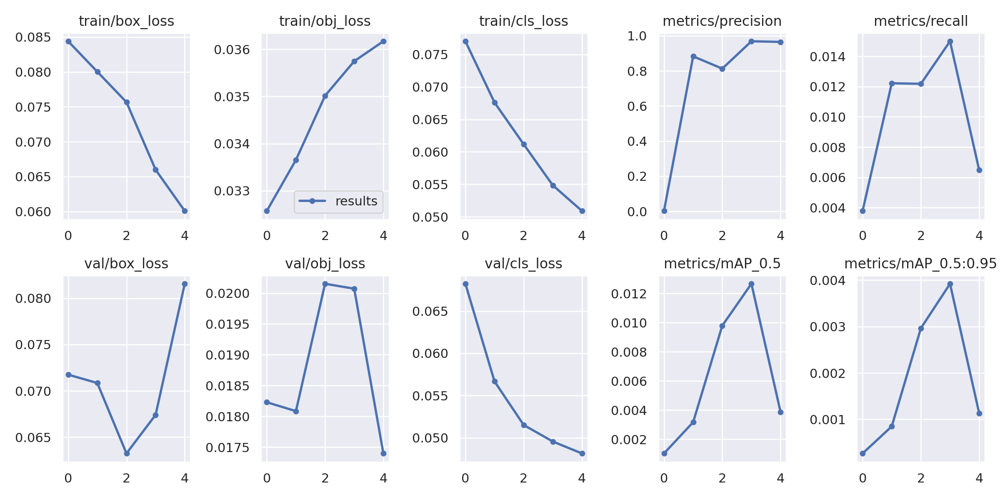

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/test_batch0_labels.jpg', width=900)

GROUND TRUTH TRAINING DATA:


FileNotFoundError: [Errno 2] No such file or directory: '/content/yolov5/runs/train/yolov5s_results/test_batch0_labels.jpg'

In [ ]:
!cd runs/train/yolov5s_results;ls

confusion_matrix.png				    labels_correlogram.jpg  PR_curve.png  weights
events.out.tfevents.1740418235.732b3b0c04db.4940.0  labels.jpg		    R_curve.png
F1_curve.png					    opt.yaml		    results.csv
hyp.yaml					    P_curve.png		    results.png


GROUND TRUTH TRAINING DATA:


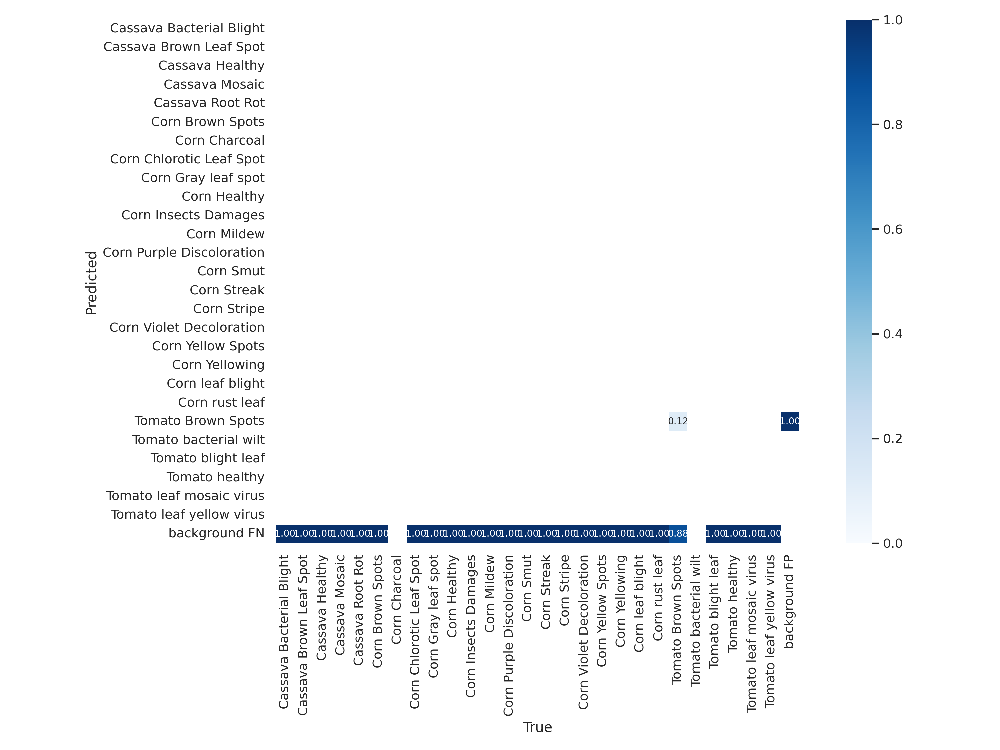

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/confusion_matrix.png', width=900)

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 5 --data /content/yolov5/FieldPlant-11/data.yaml --cfg ./models/custom_yolov5s.yaml --weights yolov5s.pt --name yolov5s_results --cache
# Check if the training output directory exists and if the image was generated
import os
output_dir = '/content/yolov5/runs/train/yolov5s_results'
if os.path.exists(output_dir):
    print(f"Training output directory '{output_dir}' exists.")
    if os.path.exists(os.path.join(output_dir, 'test_batch0_labels.jpg')):
      print("The image file 'test_batch0_labels.jpg' exists.")
    else:
        print("The image file 'test_batch0_labels.jpg' was not found in the output directory. This means the cache function did not work properly.")
else:
    print(f"Training output directory '{output_dir}' does not exist. This indicates that the training did not finish successfully.")

/content/yolov5
2025-02-24 18:29:45.035801: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1740421785.057840   20231 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1740421785.068220   20231 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-24 18:29:45.095695: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results


GROUND TRUTH TRAINING DATA:


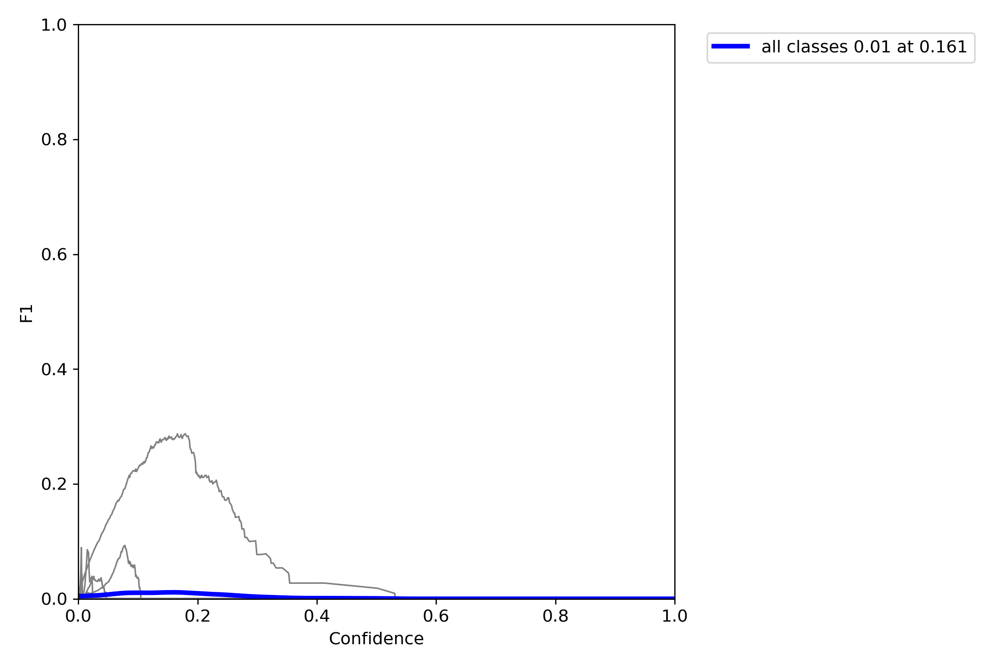

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/F1_curve.png', width=900)

# Run with weights

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [ ]:
!ls ../yolov5/FieldPlant-11/test/images

Coloration_rouge_feuilles-6-_jpg.rf.cfdc7b1c13fb941377e9cb905d3a54bf.jpg
IMG_20221118_081154_051_jpg.rf.33c305b939a748314754e91fa8be48cf.jpg
IMG_20221118_081248_266_jpg.rf.7b3f484e2a2e2b6ecbfa23dc189ef839.jpg
IMG_20221118_082353_907_jpg.rf.7eb24f7f6c7c04824079c5f141aa10aa.jpg
IMG_20221118_082453_084_jpg.rf.e89ca23b571e68ff379f583ca9282eca.jpg
IMG_20221118_082916_960_jpg.rf.9a7bf4ed851d064c95c069e29c7372da.jpg
IMG_20221118_083108_367_jpg.rf.8ba931cd74fded93a4c1a050146a7e16.jpg
IMG_20221118_084318_791_jpg.rf.1797d64de69fa83bf77a8aa2fe2bc2d6.jpg
IMG_20221118_084828_949_jpg.rf.3ceb8bc16cfa8ee6af381398399bd187.jpg
IMG_20221118_084946_970_jpg.rf.90431aa7b40d54e59e880cc3a38a5fb9.jpg
IMG_20221118_085509_627_jpg.rf.8ff5355ccf1596e7302dcb6b1a9a9cbb.jpg
IMG_20221118_085945_884_jpg.rf.979e2c83ce1125cde76ffbf3621eb758.jpg
IMG_20221118_092339_691_jpg.rf.96f2330c4afd68b546969c44129ae21d.jpg
IMG_20221118_101305_271_jpg.rf.a7e3a0fd18b2588ab2bd2e87340de620.jpg
IMG_20221118_101543_538_jpg.rf.de2b504aec16

In [ ]:
!pwd

/content/yolov5


In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source ../yolov5/FieldPlant-11/test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=../yolov5/FieldPlant-11/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-306-gfbe67e46 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)

/content/yolov5/models/experimental.py:80: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future relea

In [ ]:
!ls runs/detect/exp2

Coloration_rouge_feuilles-6-_jpg.rf.cfdc7b1c13fb941377e9cb905d3a54bf.jpg
IMG_20221118_081154_051_jpg.rf.33c305b939a748314754e91fa8be48cf.jpg
IMG_20221118_081248_266_jpg.rf.7b3f484e2a2e2b6ecbfa23dc189ef839.jpg
IMG_20221118_082353_907_jpg.rf.7eb24f7f6c7c04824079c5f141aa10aa.jpg
IMG_20221118_082453_084_jpg.rf.e89ca23b571e68ff379f583ca9282eca.jpg
IMG_20221118_082916_960_jpg.rf.9a7bf4ed851d064c95c069e29c7372da.jpg
IMG_20221118_083108_367_jpg.rf.8ba931cd74fded93a4c1a050146a7e16.jpg
IMG_20221118_084318_791_jpg.rf.1797d64de69fa83bf77a8aa2fe2bc2d6.jpg
IMG_20221118_084828_949_jpg.rf.3ceb8bc16cfa8ee6af381398399bd187.jpg
IMG_20221118_084946_970_jpg.rf.90431aa7b40d54e59e880cc3a38a5fb9.jpg
IMG_20221118_085509_627_jpg.rf.8ff5355ccf1596e7302dcb6b1a9a9cbb.jpg
IMG_20221118_085945_884_jpg.rf.979e2c83ce1125cde76ffbf3621eb758.jpg
IMG_20221118_092339_691_jpg.rf.96f2330c4afd68b546969c44129ae21d.jpg
IMG_20221118_101305_271_jpg.rf.a7e3a0fd18b2588ab2bd2e87340de620.jpg
IMG_20221118_101543_538_jpg.rf.de2b504aec16

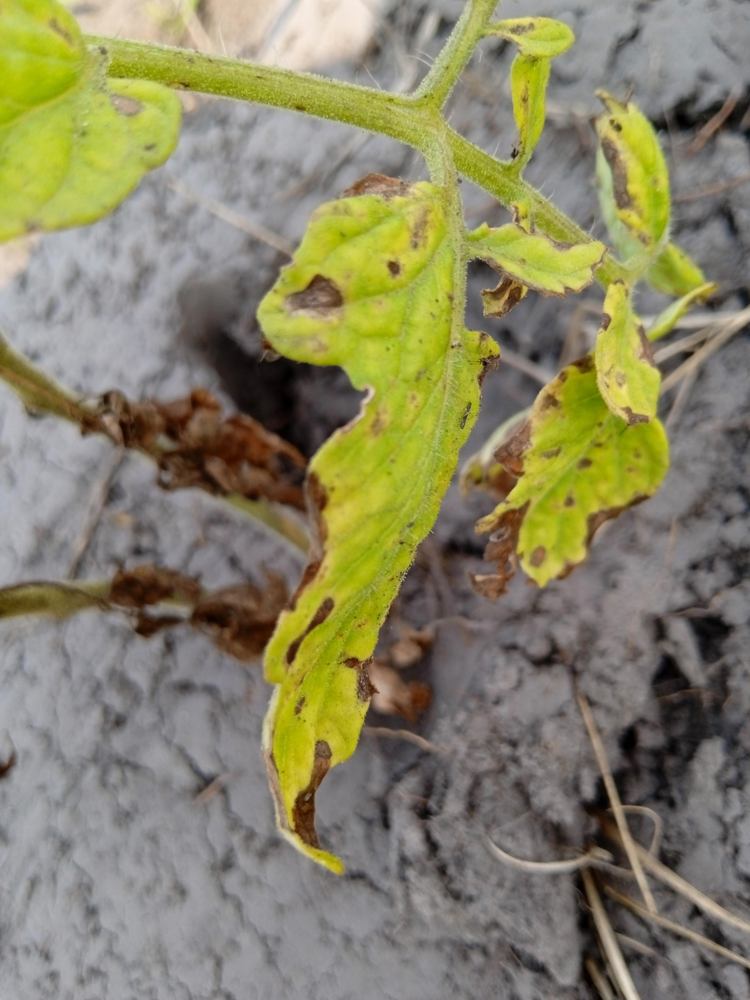

In [ ]:

display(Image(filename="runs/detect/exp2/Tomate_Taches_Brunes-894-_jpg.rf.fef7e1a9b5d73df3e24afb0b92e7d3f2.jpg"))